In [ ]:
!pip -q install kora

     |████████████████████████████████| 61kB 3.1MB/s 
     |████████████████████████████████| 61kB 5.3MB/s 


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from kora import data_table

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import normalize

In [ ]:
from sklearn.cluster import KMeans

## **1 Data Preparation**

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Data_for_MyColab/2143488_Big Data and Artificial Intelligence/HW3_movie_metadata.csv')
df.head(10)

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,886204,4834,Wes Studi,0.0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,471220,48350,Jack Davenport,0.0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,275868,11700,Stephanie Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,1144337,106759,Joseph Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,Doug Walker,Star Wars: Episode VII - The Force Awakens ...,8,143,NaN,0.0,NaN,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0
5,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,212204,1873,Polly Walker,1.0,alien|american civil war|male nipple|mars|prin...,http://www.imdb.com/title/tt0401729/?ref_=fn_t...,738.0,English,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000
6,Sam Raimi,392.0,156.0,0.0,4000.0,James Franco,24000.0,336530303.0,Action|Adventure|Romance,J.K. Simmons,Spider-Man 3,383056,46055,Kirsten Dunst,0.0,sandman|spider man|symbiote|venom|villain,http://www.imdb.com/title/tt0413300/?ref_=fn_t...,1902.0,English,USA,PG-13,258000000.0,2007.0,11000.0,6.2,2.35,0
7,Nathan Greno,324.0,100.0,15.0,284.0,Donna Murphy,799.0,200807262.0,Adventure|Animation|Comedy|Family|Fantasy|Musi...,Brad Garrett,Tangled,294810,2036,M.C. Gainey,1.0,17th century|based on fairy tale|disney|flower...,http://www.imdb.com/title/tt0398286/?ref_=fn_t...,387.0,English,USA,PG,260000000.0,2010.0,553.0,7.8,1.85,29000
8,Joss Whedon,635.0,141.0,0.0,19000.0,Robert Downey Jr.,26000.0,458991599.0,Action|Adventure|Sci-Fi,Chris Hemsworth,Avengers: Age of Ultron,462669,92000,Scarlett Johansson,4.0,artificial intelligence|based on comic book|ca...,http://www.imdb.com/title/tt2395427/?ref_=fn_t...,1117.0,English,USA,PG-13,250000000.0,2015.0,21000.0,7.5,2.35,118000
9,David Yates,375.0,153.0,282.0,10000.0,Daniel Radcliffe,25000.0,301956980.0,Adventure|Family|Fantasy|Mystery,Alan Rickman,Harry Potter and the Half-Blood Prince,321795,58753,Rupert Grint,3.0,blood|book|love|potion|professor,http://www.imdb.com/title/tt0417741/?ref_=fn_t...,973.0,English,UK,PG,250000000.0,2009.0,11000.0,7.5,2.35,10000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   director_name              4939 non-null   object 
 1   num_critic_for_reviews     4993 non-null   float64
 2   duration                   5028 non-null   float64
 3   director_facebook_likes    4939 non-null   float64
 4   actor_3_facebook_likes     5020 non-null   float64
 5   actor_2_name               5030 non-null   object 
 6   actor_1_facebook_likes     5036 non-null   float64
 7   gross                      4159 non-null   float64
 8   genres                     5043 non-null   object 
 9   actor_1_name               5036 non-null   object 
 10  movie_title                5043 non-null   object 
 11  num_voted_users            5043 non-null   int64  
 12  cast_total_facebook_likes  5043 non-null   int64  
 13  actor_3_name               5020 non-null   objec

In [ ]:
col = df.columns
for i in col:
  if df[i].dtype!='O':
    arr = np.array(df[i])
    imp = SimpleImputer(missing_values=np.nan, strategy='mean')
    imp.fit(arr.reshape(-1, 1))
    SimpleImputer()
    df[i]=imp.transform(arr.reshape(-1, 1))
df

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,James Cameron,723.000000,178.000000,0.000000,855.000000,Joel David Moore,1000.0,7.605058e+08,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,886204.0,4834.0,Wes Studi,0.0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.000000,English,USA,PG-13,2.370000e+08,2009.000000,936.0,7.9,1.780000,33000.0
1,Gore Verbinski,302.000000,169.000000,563.000000,1000.000000,Orlando Bloom,40000.0,3.094042e+08,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,471220.0,48350.0,Jack Davenport,0.0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.000000,English,USA,PG-13,3.000000e+08,2007.000000,5000.0,7.1,2.350000,0.0
2,Sam Mendes,602.000000,148.000000,0.000000,161.000000,Rory Kinnear,11000.0,2.000742e+08,Action|Adventure|Thriller,Christoph Waltz,Spectre,275868.0,11700.0,Stephanie Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.000000,English,UK,PG-13,2.450000e+08,2015.000000,393.0,6.8,2.350000,85000.0
3,Christopher Nolan,813.000000,164.000000,22000.000000,23000.000000,Christian Bale,27000.0,4.481306e+08,Action|Thriller,Tom Hardy,The Dark Knight Rises,1144337.0,106759.0,Joseph Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.000000,English,USA,PG-13,2.500000e+08,2012.000000,23000.0,8.5,2.350000,164000.0
4,Doug Walker,140.194272,107.201074,131.000000,645.009761,Rob Walker,131.0,4.846841e+07,Documentary,Doug Walker,Star Wars: Episode VII - The Force Awakens ...,8.0,143.0,NaN,0.0,NaN,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,272.770808,NaN,NaN,NaN,3.975262e+07,2002.470517,12.0,7.1,2.220403,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,Scott Smith,1.000000,87.000000,2.000000,318.000000,Daphne Zuniga,637.0,4.846841e+07,Comedy|Drama,Eric Mabius,Signed Sealed Delivered,629.0,2283.0,Crystal Lowe,2.0,fraud|postal worker|prison|theft|trial,http://www.imdb.com/title/tt3000844/?ref_=fn_t...,6.000000,English,Canada,NaN,3.975262e+07,2013.000000,470.0,7.7,2.220403,84.0
5039,NaN,43.000000,43.000000,686.509212,319.000000,Valorie Curry,841.0,4.846841e+07,Crime|Drama|Mystery|Thriller,Natalie Zea,The Following,73839.0,1753.0,Sam Underwood,1.0,cult|fbi|hideout|prison escape|serial killer,http://www.imdb.com/title/tt2071645/?ref_=fn_t...,359.000000,English,USA,TV-14,3.975262e+07,2002.470517,593.0,7.5,16.000000,32000.0
5040,Benjamin Roberds,13.000000,76.000000,0.000000,0.000000,Maxwell Moody,0.0,4.846841e+07,Drama|Horror|Thriller,Eva Boehnke,A Plague So Pleasant,38.0,0.0,David Chandler,0.0,NaN,http://www.imdb.com/title/tt2107644/?ref_=fn_t...,3.000000,English,USA,NaN,1.400000e+03,2013.000000,0.0,6.3,2.220403,16.0
5041,Daniel Hsia,14.000000,100.000000,0.000000,489.000000,Daniel Henney,946.0,1.044300e+04,Comedy|Drama|Romance,Alan Ruck,Shanghai Calling,1255.0,2386.0,Eliza Coupe,5.0,NaN,http://www.imdb.com/title/tt2070597/?ref_=fn_t...,9.000000,English,USA,PG-13,3.975262e+07,2012.000000,719.0,6.3,2.350000,660.0


In [ ]:
df_new = df.drop(['movie_imdb_link','movie_title','actor_1_name','actor_2_name','actor_3_name'],axis=1)
df_new['plot_keywords'] = df_new['plot_keywords'].replace(np.nan,'none')
for i in range(len(df_new)):
  if df_new.at[i,'genres']!=np.nan:
    df_new.at[i,'genres'] = df_new.at[i,'genres'].split('|')
  df_new.at[i,'plot_keywords'] = df_new.at[i,'plot_keywords'].split('|')
df_new

,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,genres,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,plot_keywords,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,James Cameron,723.000000,178.000000,0.000000,855.000000,1000.0,7.605058e+08,"[Action, Adventure, Fantasy, Sci-Fi]",886204.0,4834.0,0.0,"[avatar, future, marine, native, paraplegic]",3054.000000,English,USA,PG-13,2.370000e+08,2009.000000,936.0,7.9,1.780000,33000.0
1,Gore Verbinski,302.000000,169.000000,563.000000,1000.000000,40000.0,3.094042e+08,"[Action, Adventure, Fantasy]",471220.0,48350.0,0.0,"[goddess, marriage ceremony, marriage proposal...",1238.000000,English,USA,PG-13,3.000000e+08,2007.000000,5000.0,7.1,2.350000,0.0
2,Sam Mendes,602.000000,148.000000,0.000000,161.000000,11000.0,2.000742e+08,"[Action, Adventure, Thriller]",275868.0,11700.0,1.0,"[bomb, espionage, sequel, spy, terrorist]",994.000000,English,UK,PG-13,2.450000e+08,2015.000000,393.0,6.8,2.350000,85000.0
3,Christopher Nolan,813.000000,164.000000,22000.000000,23000.000000,27000.0,4.481306e+08,"[Action, Thriller]",1144337.0,106759.0,0.0,"[deception, imprisonment, lawlessness, police ...",2701.000000,English,USA,PG-13,2.500000e+08,2012.000000,23000.0,8.5,2.350000,164000.0
4,Doug Walker,140.194272,107.201074,131.000000,645.009761,131.0,4.846841e+07,[Documentary],8.0,143.0,0.0,[none],272.770808,NaN,NaN,NaN,3.975262e+07,2002.470517,12.0,7.1,2.220403,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,Scott Smith,1.000000,87.000000,2.000000,318.000000,637.0,4.846841e+07,"[Comedy, Drama]",629.0,2283.0,2.0,"[fraud, postal worker, prison, theft, trial]",6.000000,English,Canada,NaN,3.975262e+07,2013.000000,470.0,7.7,2.220403,84.0
5039,NaN,43.000000,43.000000,686.509212,319.000000,841.0,4.846841e+07,"[Crime, Drama, Mystery, Thriller]",73839.0,1753.0,1.0,"[cult, fbi, hideout, prison escape, serial kil...",359.000000,English,USA,TV-14,3.975262e+07,2002.470517,593.0,7.5,16.000000,32000.0
5040,Benjamin Roberds,13.000000,76.000000,0.000000,0.000000,0.0,4.846841e+07,"[Drama, Horror, Thriller]",38.0,0.0,0.0,[none],3.000000,English,USA,NaN,1.400000e+03,2013.000000,0.0,6.3,2.220403,16.0
5041,Daniel Hsia,14.000000,100.000000,0.000000,489.000000,946.0,1.044300e+04,"[Comedy, Drama, Romance]",1255.0,2386.0,5.0,[none],9.000000,English,USA,PG-13,3.975262e+07,2012.000000,719.0,6.3,2.350000,660.0


In [ ]:
# df_new = df_new.drop(['director_name','plot_keywords','country','language'],axis=1)
df_new = df_new.drop(['director_name','plot_keywords','country','language','genres','content_rating'],axis=1)

In [ ]:
df_new = df_new.replace(np.nan,'Unknown')
df_new

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,723.000000,178.000000,0.000000,855.000000,1000.0,7.605058e+08,886204.0,4834.0,0.0,3054.000000,2.370000e+08,2009.000000,936.0,7.9,1.780000,33000.0
1,302.000000,169.000000,563.000000,1000.000000,40000.0,3.094042e+08,471220.0,48350.0,0.0,1238.000000,3.000000e+08,2007.000000,5000.0,7.1,2.350000,0.0
2,602.000000,148.000000,0.000000,161.000000,11000.0,2.000742e+08,275868.0,11700.0,1.0,994.000000,2.450000e+08,2015.000000,393.0,6.8,2.350000,85000.0
3,813.000000,164.000000,22000.000000,23000.000000,27000.0,4.481306e+08,1144337.0,106759.0,0.0,2701.000000,2.500000e+08,2012.000000,23000.0,8.5,2.350000,164000.0
4,140.194272,107.201074,131.000000,645.009761,131.0,4.846841e+07,8.0,143.0,0.0,272.770808,3.975262e+07,2002.470517,12.0,7.1,2.220403,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,1.000000,87.000000,2.000000,318.000000,637.0,4.846841e+07,629.0,2283.0,2.0,6.000000,3.975262e+07,2013.000000,470.0,7.7,2.220403,84.0
5039,43.000000,43.000000,686.509212,319.000000,841.0,4.846841e+07,73839.0,1753.0,1.0,359.000000,3.975262e+07,2002.470517,593.0,7.5,16.000000,32000.0
5040,13.000000,76.000000,0.000000,0.000000,0.0,4.846841e+07,38.0,0.0,0.0,3.000000,1.400000e+03,2013.000000,0.0,6.3,2.220403,16.0
5041,14.000000,100.000000,0.000000,489.000000,946.0,1.044300e+04,1255.0,2386.0,5.0,9.000000,3.975262e+07,2012.000000,719.0,6.3,2.350000,660.0


In [ ]:
df_new.num_critic_for_reviews = df_new.num_critic_for_reviews.astype('int32')
df_new.duration               = df_new.duration.astype('int32')
df_new.director_facebook_likes= df_new.director_facebook_likes.astype('int32')
df_new.actor_1_facebook_likes = df_new.actor_1_facebook_likes.astype('int32')
df_new.actor_2_facebook_likes = df_new.actor_2_facebook_likes.astype('int32')
df_new.actor_3_facebook_likes = df_new.actor_3_facebook_likes.astype('int32')
df_new.gross                  = df_new.gross.astype('int32')
df_new.title_year             = df_new.title_year.astype('int32')
df_new.imdb_score             = df_new.imdb_score.round().astype('int32')
df_new


,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,723,178,0,855,1000,760505847,886204.0,4834.0,0.0,3054.000000,2.370000e+08,2009,936,8,1.780000,33000.0
1,302,169,563,1000,40000,309404152,471220.0,48350.0,0.0,1238.000000,3.000000e+08,2007,5000,7,2.350000,0.0
2,602,148,0,161,11000,200074175,275868.0,11700.0,1.0,994.000000,2.450000e+08,2015,393,7,2.350000,85000.0
3,813,164,22000,23000,27000,448130642,1144337.0,106759.0,0.0,2701.000000,2.500000e+08,2012,23000,8,2.350000,164000.0
4,140,107,131,645,131,48468407,8.0,143.0,0.0,272.770808,3.975262e+07,2002,12,7,2.220403,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,1,87,2,318,637,48468407,629.0,2283.0,2.0,6.000000,3.975262e+07,2013,470,8,2.220403,84.0
5039,43,43,686,319,841,48468407,73839.0,1753.0,1.0,359.000000,3.975262e+07,2002,593,8,16.000000,32000.0
5040,13,76,0,0,0,48468407,38.0,0.0,0.0,3.000000,1.400000e+03,2013,0,6,2.220403,16.0
5041,14,100,0,489,946,10443,1255.0,2386.0,5.0,9.000000,3.975262e+07,2012,719,6,2.350000,660.0


In [ ]:
x = df_new.drop('imdb_score',axis=1)
y = df_new.imdb_score

In [ ]:
for i in x.columns:
  x_array = np.array(x[i])
  normalized_arr = normalize([x_array])
  x[i]=normalized_arr[0]
x

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,aspect_ratio,movie_facebook_likes
0,0.054980,0.022763,0.000000,0.006757,0.000860,0.135868,7.713441e-02,0.003306,0.000000,0.092394,1.670553e-02,0.014127,0.003022,0.009667,0.022414
1,0.022965,0.021612,0.002765,0.007903,0.034388,0.055277,4.101457e-02,0.033068,0.000000,0.037454,2.114625e-02,0.014113,0.016143,0.012763,0.000000
2,0.045778,0.018927,0.000000,0.001272,0.009457,0.035744,2.401131e-02,0.008002,0.005786,0.030072,1.726943e-02,0.014170,0.001269,0.012763,0.057732
3,0.061824,0.020973,0.108046,0.181760,0.023212,0.080061,9.960208e-02,0.073015,0.000000,0.081714,1.762187e-02,0.014149,0.074256,0.012763,0.111389
4,0.010646,0.013684,0.000643,0.005097,0.000113,0.008659,6.963129e-07,0.000098,0.000000,0.008252,2.802062e-03,0.014078,0.000039,0.012059,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,0.000076,0.011126,0.000010,0.002513,0.000548,0.008659,5.474760e-05,0.001561,0.011572,0.000182,2.802062e-03,0.014156,0.001517,0.012059,0.000057
5039,0.003270,0.005499,0.003369,0.002521,0.000723,0.008659,6.426881e-03,0.001199,0.005786,0.010861,2.802062e-03,0.014078,0.001915,0.086894,0.021734
5040,0.000989,0.009719,0.000000,0.000000,0.000000,0.008659,3.307486e-06,0.000000,0.000000,0.000091,9.868248e-08,0.014156,0.000000,0.012059,0.000011
5041,0.001065,0.012788,0.000000,0.003864,0.000813,0.000002,1.092341e-04,0.001632,0.028930,0.000272,2.802062e-03,0.014149,0.002321,0.012763,0.000448


## **2 Data Visualization and Analytics**

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
ss = []
wcss = []

K = range(2, 15)
 
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(x)
    kmeanModel.fit(x)

    wcss.append(kmeanModel.inertia_)
    ss.append(silhouette_score(x, kmeanModel.predict(x)))


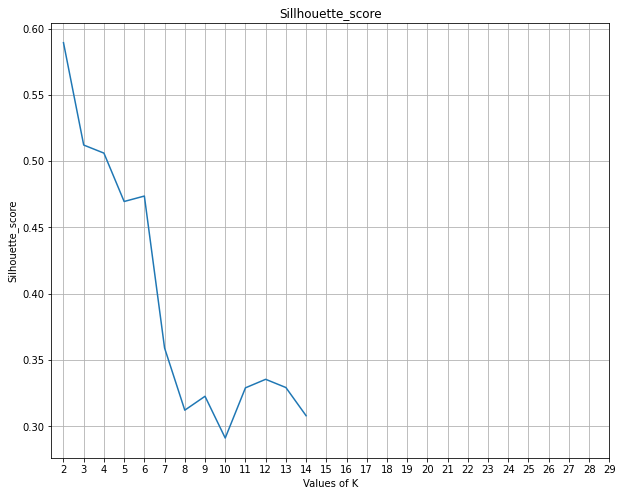

In [ ]:
fig = plt.figure(figsize=(10,8))
plt.plot(K, ss)
plt.xlabel('Values of K')
plt.ylabel('Silhouette_score')
plt.title('Sillhouette_score')
plt.xticks(np.arange(2, 30, step=1))
plt.grid()
plt.show()

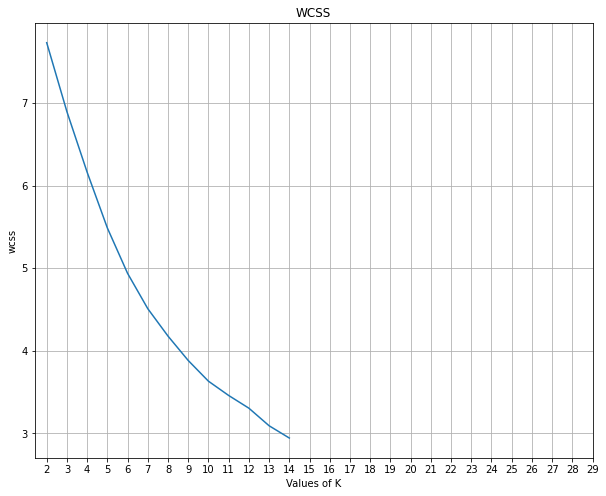

In [ ]:
fig = plt.figure(figsize=(10,8))
plt.plot(K, wcss)
plt.xlabel('Values of K')
plt.ylabel('wcss')
plt.title('WCSS')
plt.xticks(np.arange(2, 30, step=1))
plt.grid()
plt.show()

K should be 2

## **3 K-means Segmentation**

In [ ]:
# KMModel = KMeans(n_clusters=2).fit(x)
# KMModel.fit(x)
# label=KMModel.predict(x)

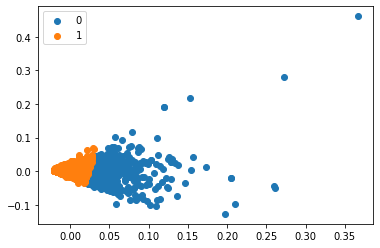

In [ ]:
import numpy as np
from scipy.spatial.distance import cdist 
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
 
def kmeans(x,k, no_of_iterations):
    idx = np.random.choice(len(x), k, replace=False)

    centroids = x[idx, :]

    distances = cdist(x, centroids ,'euclidean')

    points = np.array([np.argmin(i) for i in distances])

    for _ in range(no_of_iterations): 
        centroids = []
        for idx in range(k):
            
            temp_cent = x[points==idx].mean(axis=0) 
            centroids.append(temp_cent)
 
        centroids = np.vstack(centroids)
         
        distances = cdist(x, centroids ,'euclidean')
        points = np.array([np.argmin(i) for i in distances])
         
    return points 

pca = PCA(2)
df = pca.fit_transform(x)
label = kmeans(df,2,30)
 

 
u_labels = np.unique(label)
for i in u_labels:
    plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
plt.legend()
plt.show()

In [ ]:
compare = pd.DataFrame({'label':label,'imdb_score':y})

In [ ]:
compare

,label,imdb_score
0,0,8
1,0,7
2,0,7
3,0,8
4,1,7
...,...,...
5038,1,8
5039,1,8
5040,1,6
5041,1,6


In [ ]:
compare[compare.label==0].imdb_score.value_counts()

8    231
7    182
6    110
9     24
5     12
4      3
Name: imdb_score, dtype: int64

In [ ]:
compare[compare.label==1].imdb_score.value_counts()

6     1517
7     1488
8      607
5      538
4      216
3       70
9       24
2       20
10       1
Name: imdb_score, dtype: int64

## **4 Evaluation**

In [ ]:
KMModel = KMeans(n_clusters=2).fit(df)
KMModel.fit(df)
label_2=KMModel.predict(df)
distances = KMModel.fit_transform(df)

In [ ]:
centroids = KMModel.cluster_centers_

In [ ]:
centroids

array([[-0.00666284,  0.00095315],
       [ 0.05312485, -0.00759974]])

In [ ]:
distances

array([[0.14758807, 0.10390618],
       [0.06765625, 0.00753537],
       [0.06848239, 0.03541672],
       ...,
       [0.01169893, 0.07192261],
       [0.01236005, 0.071468  ],
       [0.01228611, 0.07257638]])

In [ ]:
c1 = []
c2 = []
for i in range(len(distances)):
  distance_c1 = np.sqrt((distances[i][0]-centroids[0][0])**2+(distances[i][1]-centroids[0][1])**2)
  distance_c2 = np.sqrt((distances[i][0]-centroids[1][0])**2+(distances[i][1]-centroids[1][1])**2)
  c1.append(distance_c1)
  c2.append(distance_c2)

In [ ]:
print(sum(c1)/len(c1))
print(sum(c2)/len(c2))


0.06654306027473829
0.07806994118700337
